In [1]:
import pandas as pd
import numpy as np
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
stop_words = set(stopwords.words("english"))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mkhan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\mkhan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\mkhan\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mkhan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
filepath = 'stock_reports.csv'
stock_names = 'Stock'

In [3]:
df = pd.read_csv(filepath)
df.set_index(stock_names, inplace=True)
df.head(1)

,Apr 2021_content,Apr 2021_topic,Aug 2021_content,Aug 2021_topic,Dec 2020_content,Dec 2020_topic,Feb 2021_content,Feb 2021_topic,Jan 2021_content,Jan 2021_topic,...,May 2021_content,May 2021_topic,Nov 2020_content,Nov 2020_topic,Oct 2020_content,Oct 2020_topic,Sep 2020_content,Sep 2020_topic,Sep 2021_content,Sep 2021_topic
Stock,,,,,,,,,,,,,,,,,,,,,
sava,"AUSTIN, Texas, April 26, 2021 (GLOBE NEWSWIRE)...",Cassava Sciences Invited by the NIH to Partici...,"AUSTIN, Texas, Aug. 03, 2021 (GLOBE NEWSWIRE) ...",Cassava Sciences Reports Second Quarter 2021 F...,Neutral,Neutral,- Patients’ Cognition Improved 1.6 Points on A...,Cassava Sciences’ Simufilam Improves Cognition...,"AUSTIN, Texas, Jan. 04, 2021 (GLOBE NEWSWIRE) ...",Cassava Sciences Appoints Dr. James Kupiec as ...,...,"- Randomized, Controlled Study is Designed to ...",Cassava Sciences Announces Initiation of Cogni...,"AUSTIN, Texas, Nov. 27, 2020 (GLOBE NEWSWIRE) ...",USAN Modifies Lead Drug Candidate’s Chemical N...,Neutral,Neutral,Alzheimer’s Patients in Drug Groups Showed Sta...,Cassava Sciences Announces Final Results of a ...,"AUSTIN, Texas, Sept. 09, 2021 (GLOBE NEWSWIRE)...",Cassava Sciences to Present at H.C. Wainwright...


# Text Preprocessing

In [4]:
def preprocessing_pipeline(df):
    
    print("Text Preprocessing...")
    
    for col in df.columns:
        print(f"Performing preprocessing for column: {col}------------------------------------------------")
        
        # convert to lower case
        print("Converting to lower case...")
        df[col] = df[col].str.lower()
        
        # remove punctuations
        print("Removing Punctuations...")
        df[col] = df[col].str.replace(r'[^\w\s]', '', regex=True)
        
        # Tokenization
        print("Tokenization...")
        df[col] = df[col].apply(word_tokenize)
        
        # Lemmatization
        print("Lemmatization...")
        lm = WordNetLemmatizer()
        df[col] = df[col].apply(lambda words: [lm.lemmatize(word) for word in words])
            
        # Removing stop words
        print("Removing stop words...")
        df[col] = df[col].apply(lambda x: [word for word in x if word not in stop_words])
        
        # join text back
        df[col] = df[col].apply(lambda words: ' '.join(words))
        
        all_words = ' '.join([text for text in df[col]])
        word_cloud=WordCloud(width=800, 
                             height=500,
                             random_state=21,
                             max_font_size=110,
                             colormap='tab20').generate(all_words)

        plt.figure(figsize=(15, 10))
        plt.imshow(word_cloud)
        plt.axis('off')
        plt.show()
        
        print(f"Preprocessing complete for {col}!-----------------------------------------------------------\n")   
       
    return df

Text Preprocessing...
Performing preprocessing for column: Apr 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


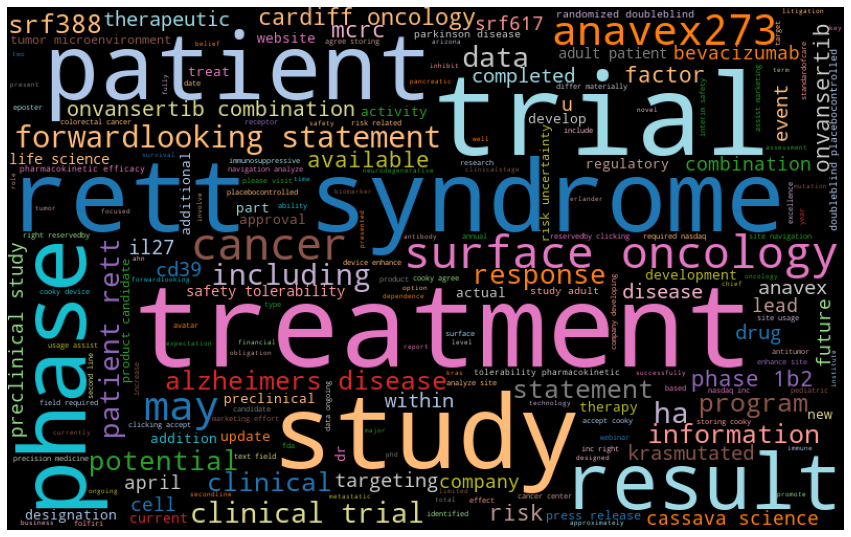

Preprocessing complete for Apr 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Apr 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


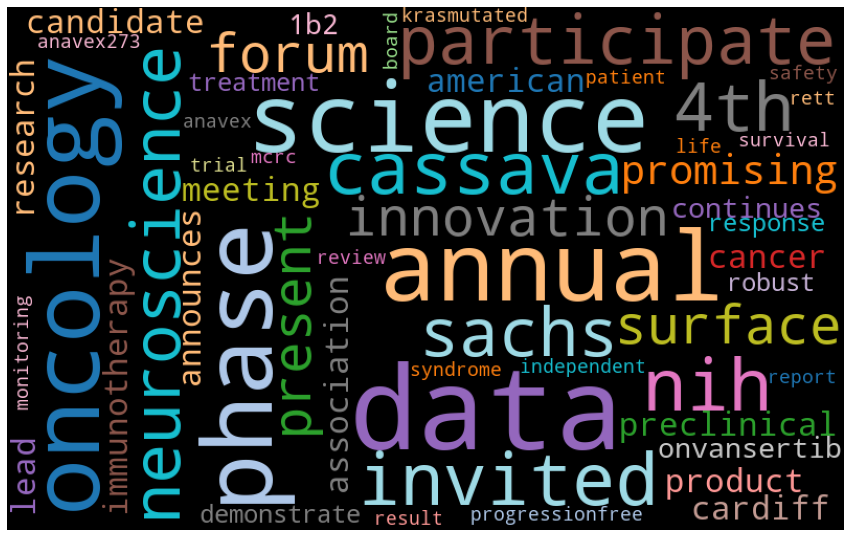

Preprocessing complete for Apr 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Aug 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


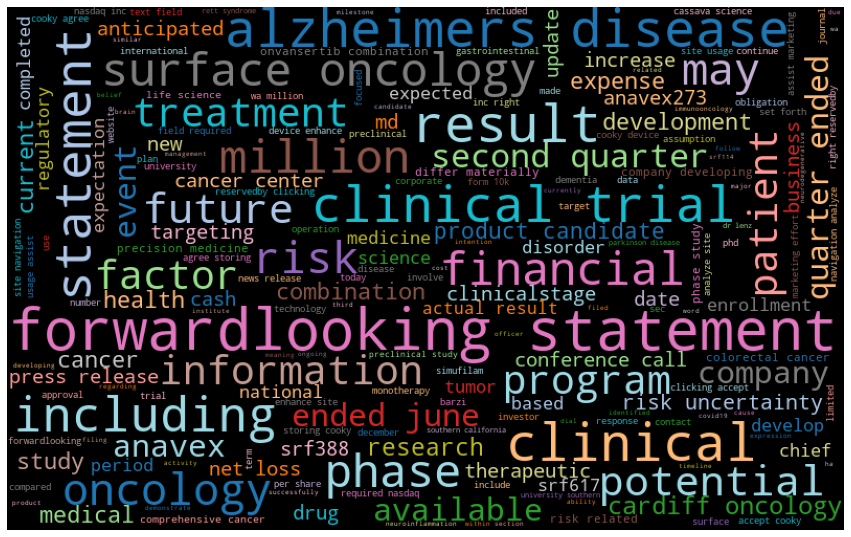

Preprocessing complete for Aug 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Aug 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


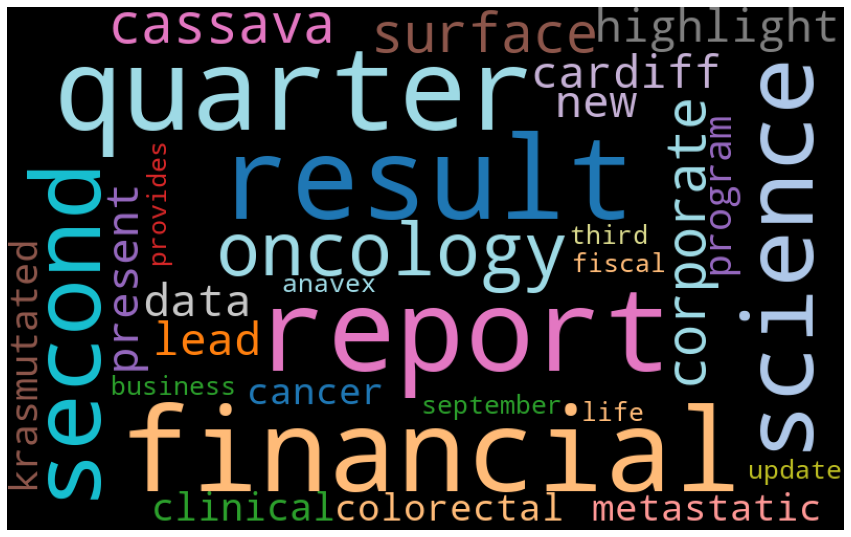

Preprocessing complete for Aug 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Dec 2020_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


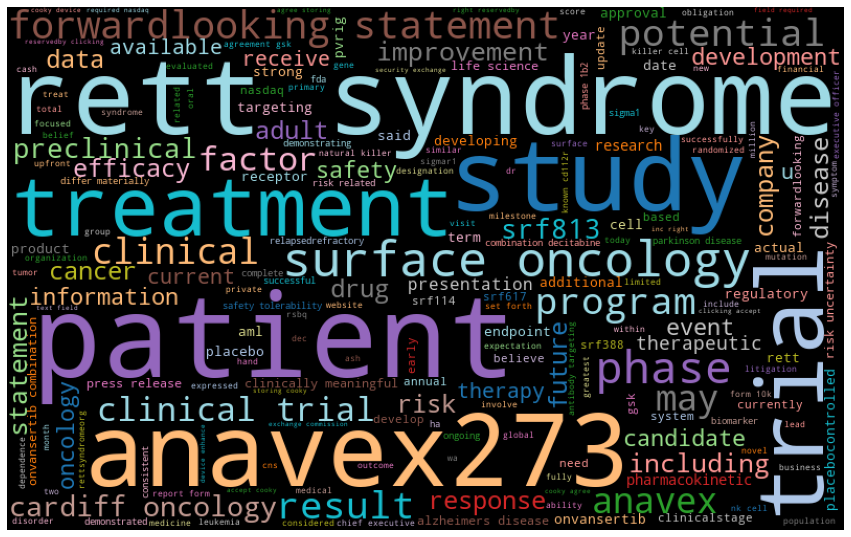

Preprocessing complete for Dec 2020_content!-----------------------------------------------------------

Performing preprocessing for column: Dec 2020_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


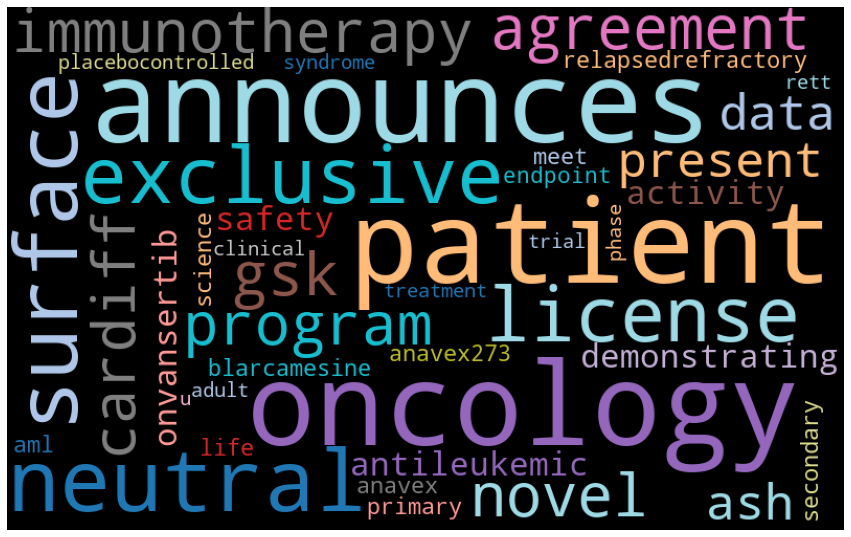

Preprocessing complete for Dec 2020_topic!-----------------------------------------------------------

Performing preprocessing for column: Feb 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


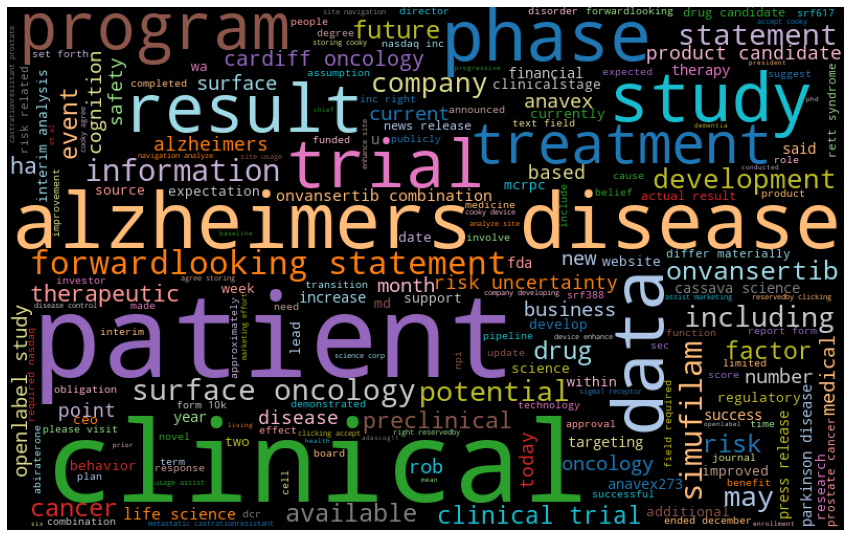

Preprocessing complete for Feb 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Feb 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


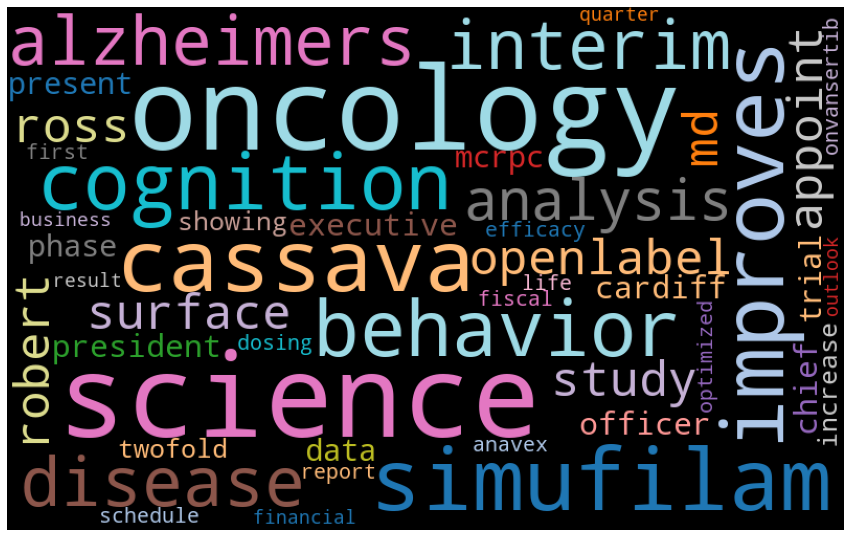

Preprocessing complete for Feb 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Jan 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


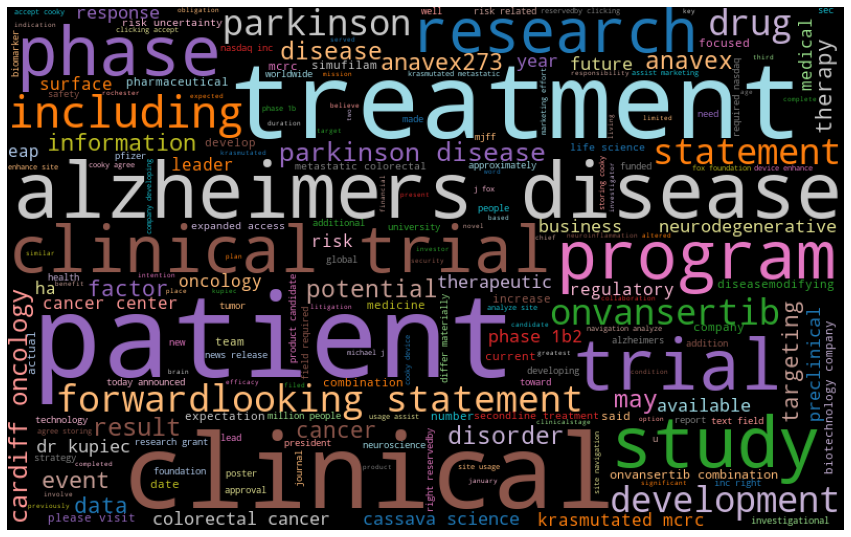

Preprocessing complete for Jan 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Jan 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


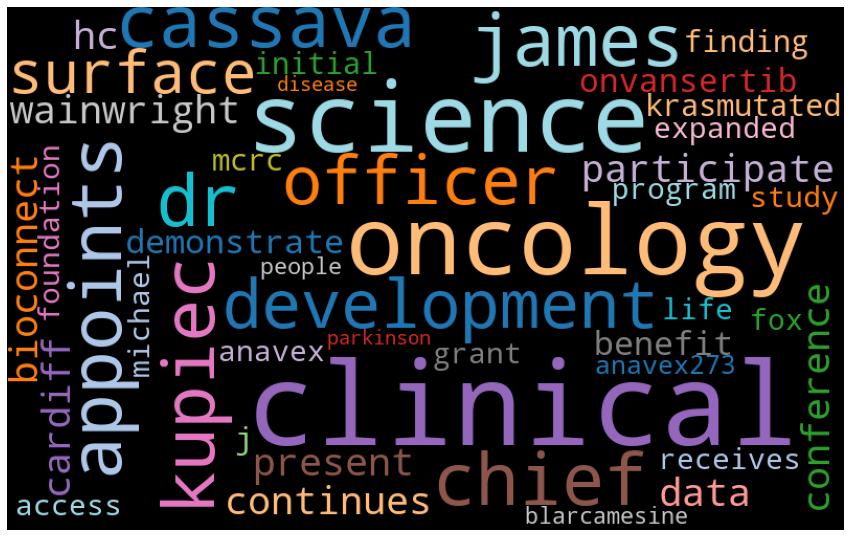

Preprocessing complete for Jan 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Jul 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


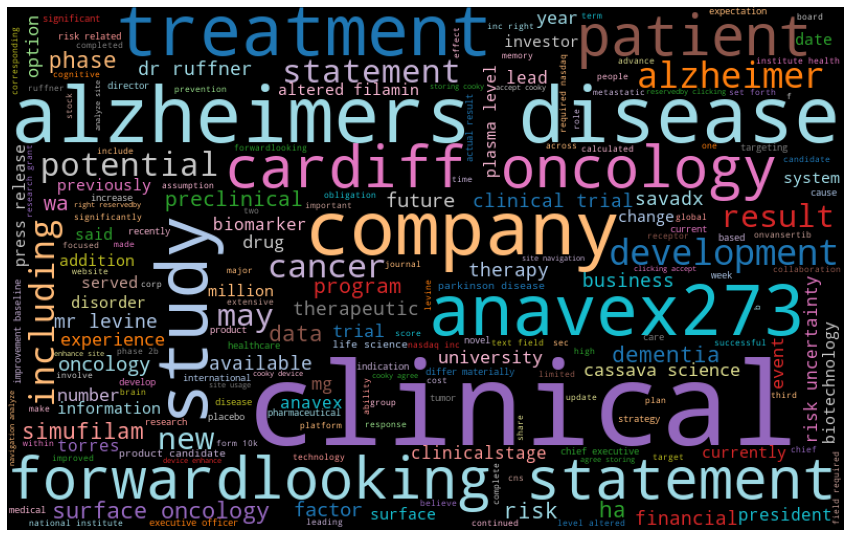

Preprocessing complete for Jul 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Jul 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


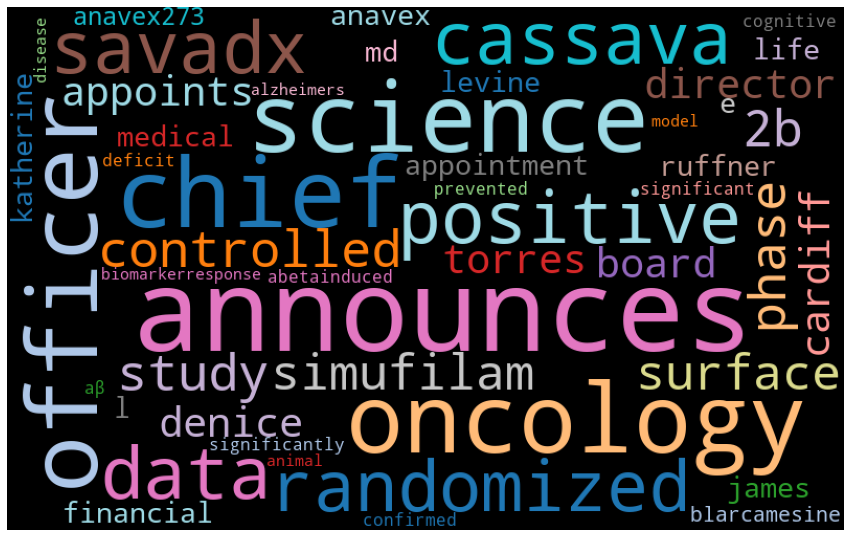

Preprocessing complete for Jul 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Jun 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


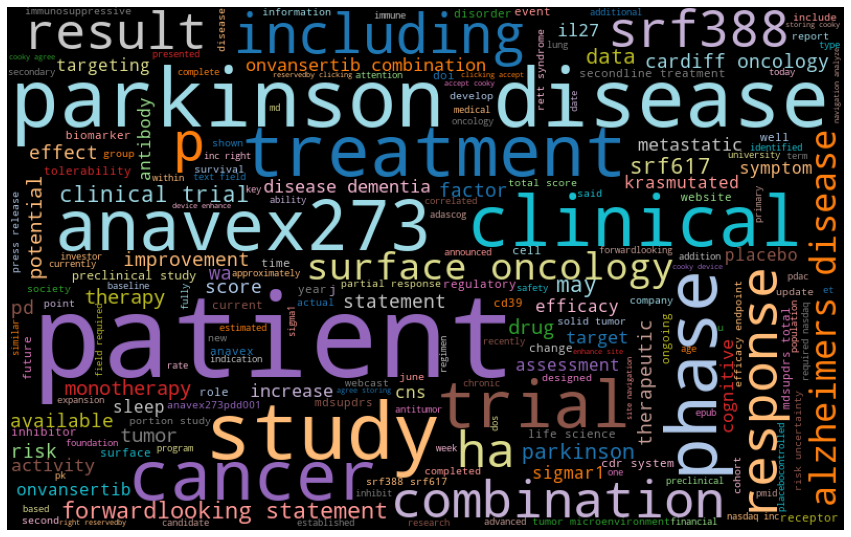

Preprocessing complete for Jun 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Jun 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


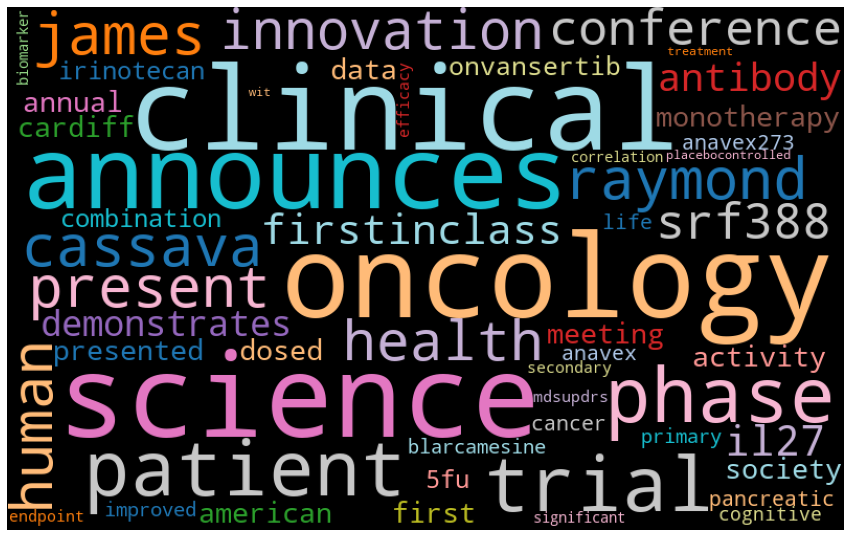

Preprocessing complete for Jun 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Mar 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


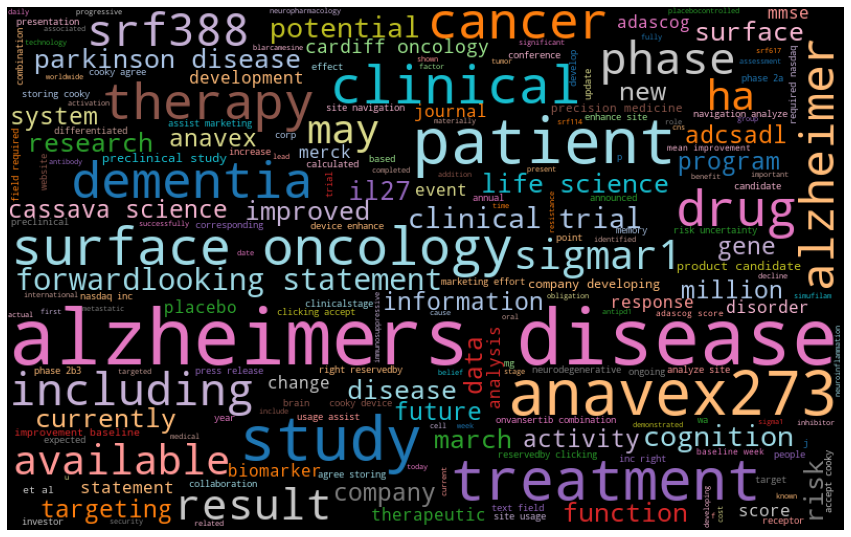

Preprocessing complete for Mar 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Mar 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


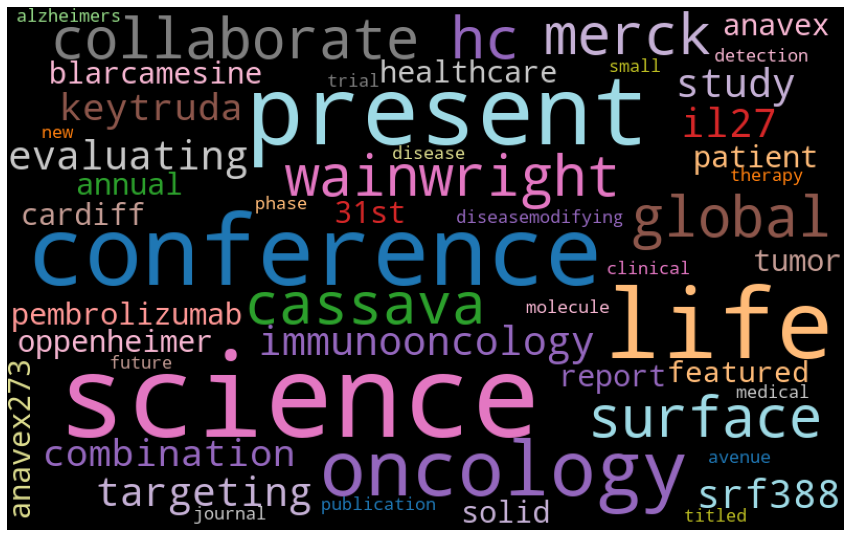

Preprocessing complete for Mar 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: May 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


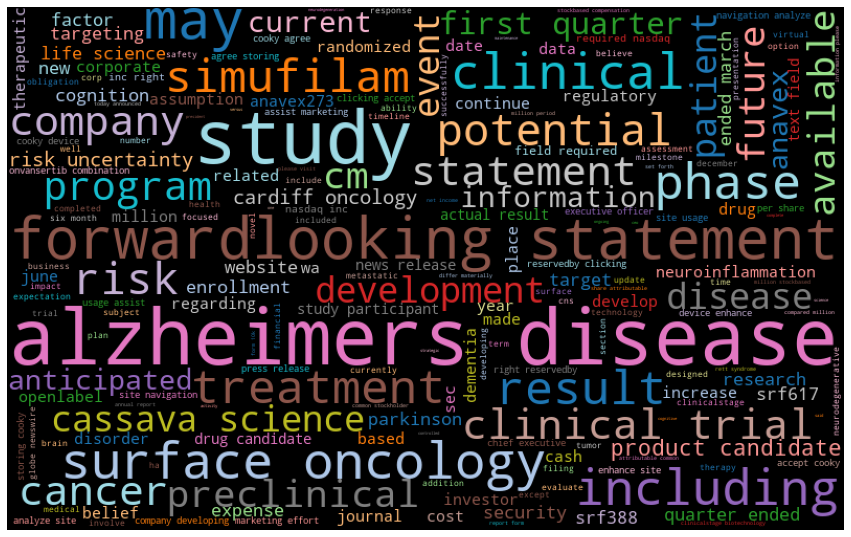

Preprocessing complete for May 2021_content!-----------------------------------------------------------

Performing preprocessing for column: May 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


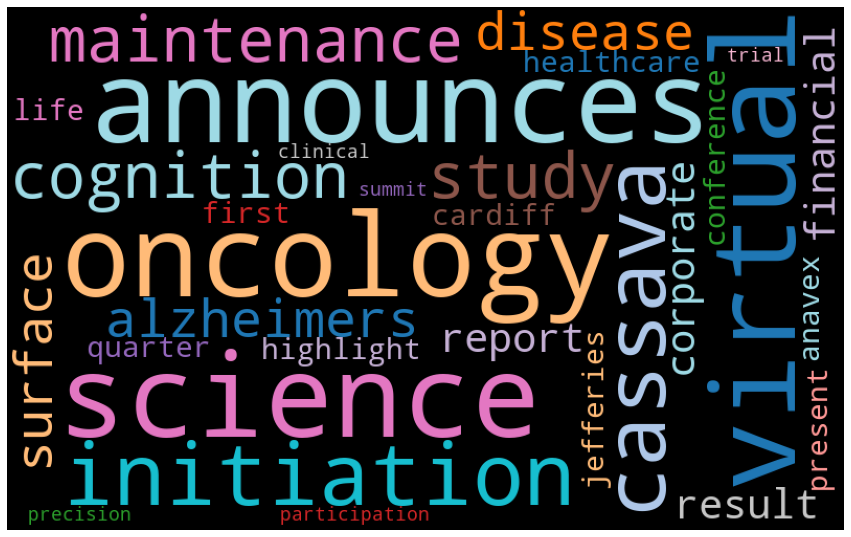

Preprocessing complete for May 2021_topic!-----------------------------------------------------------

Performing preprocessing for column: Nov 2020_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


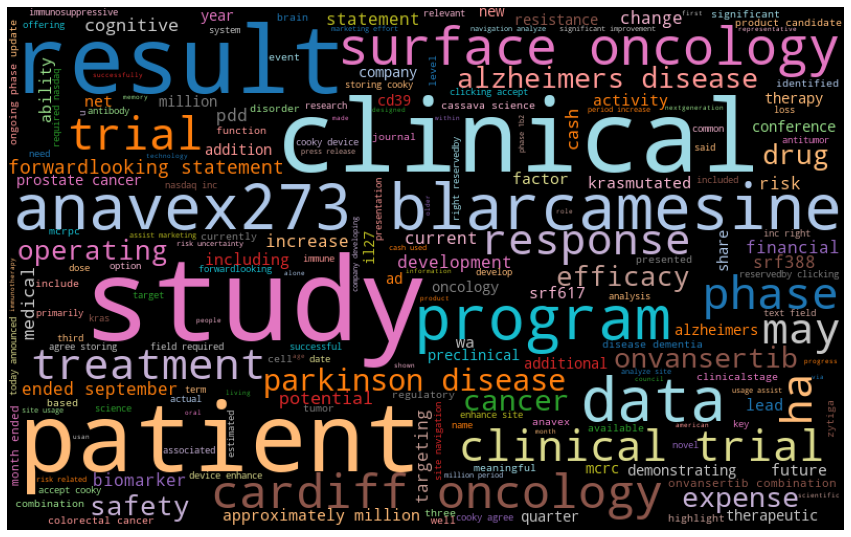

Preprocessing complete for Nov 2020_content!-----------------------------------------------------------

Performing preprocessing for column: Nov 2020_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


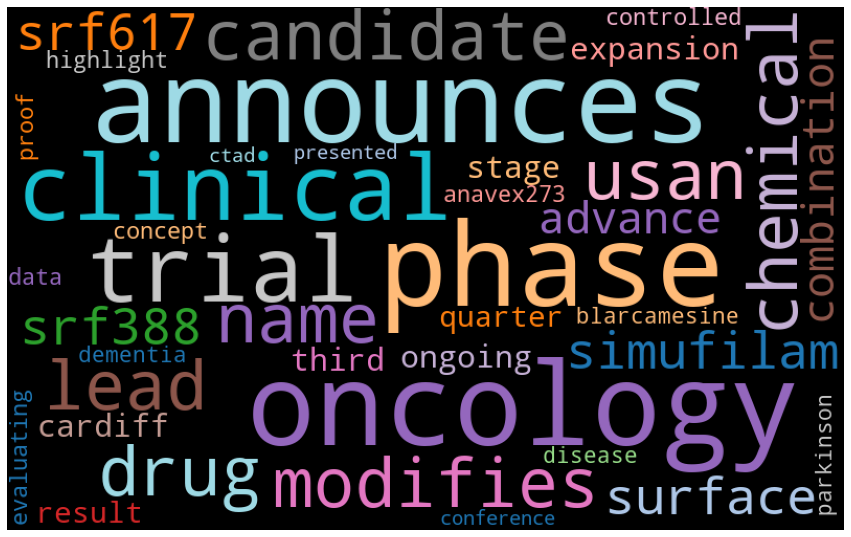

Preprocessing complete for Nov 2020_topic!-----------------------------------------------------------

Performing preprocessing for column: Oct 2020_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


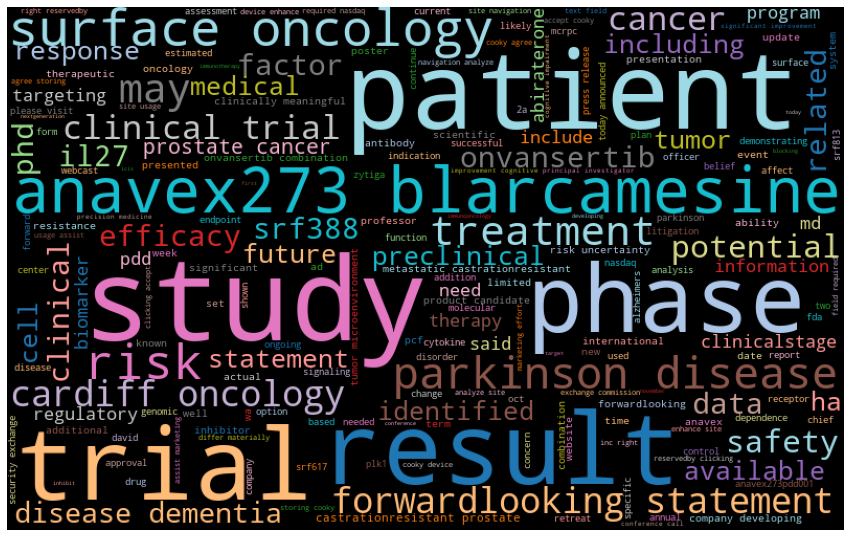

Preprocessing complete for Oct 2020_content!-----------------------------------------------------------

Performing preprocessing for column: Oct 2020_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


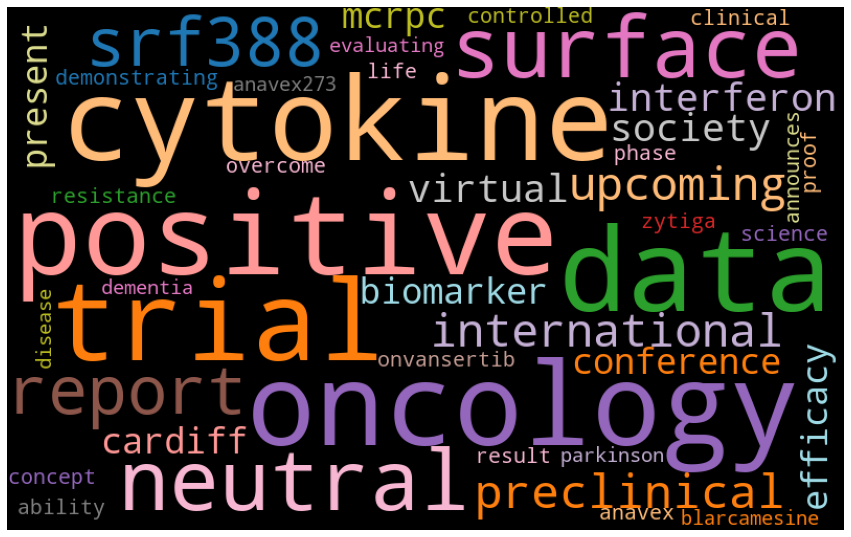

Preprocessing complete for Oct 2020_topic!-----------------------------------------------------------

Performing preprocessing for column: Sep 2020_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


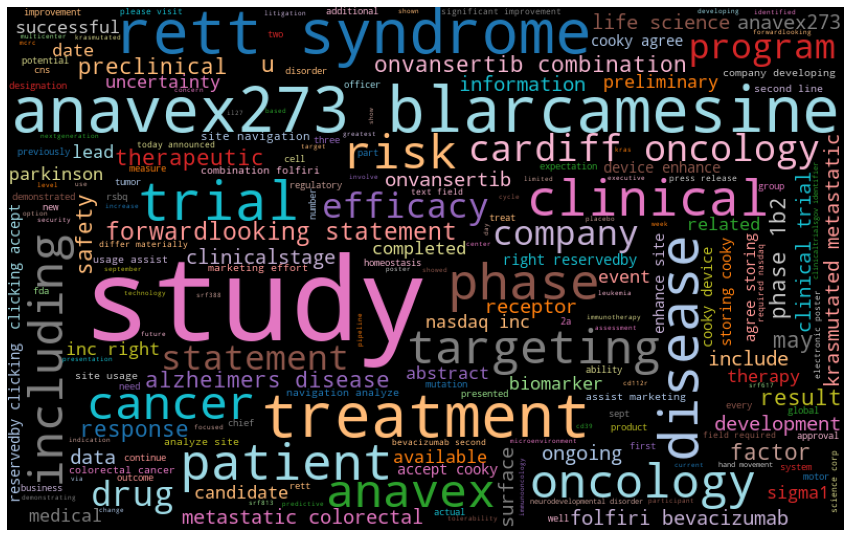

Preprocessing complete for Sep 2020_content!-----------------------------------------------------------

Performing preprocessing for column: Sep 2020_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


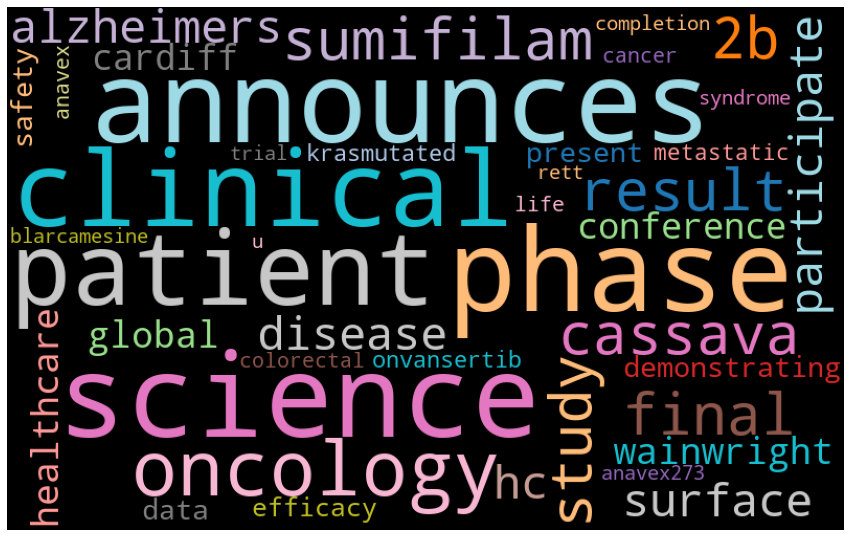

Preprocessing complete for Sep 2020_topic!-----------------------------------------------------------

Performing preprocessing for column: Sep 2021_content------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


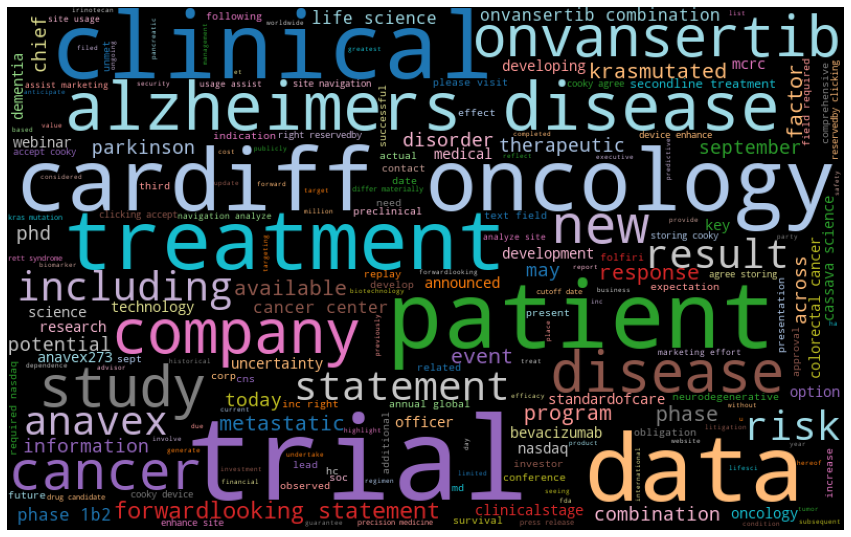

Preprocessing complete for Sep 2021_content!-----------------------------------------------------------

Performing preprocessing for column: Sep 2021_topic------------------------------------------------
Converting to lower case...
Removing Punctuations...
Tokenization...
Lemmatization...
Removing stop words...


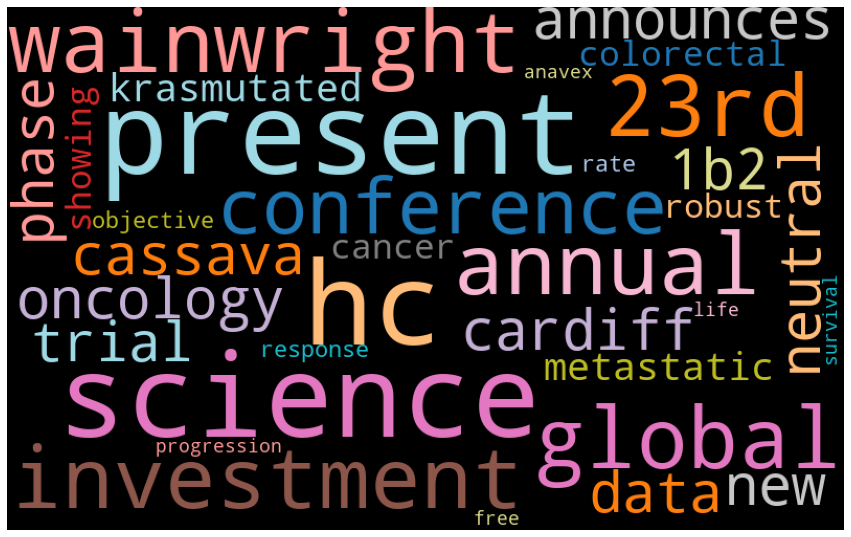

Preprocessing complete for Sep 2021_topic!-----------------------------------------------------------



In [5]:
df_new = preprocessing_pipeline(df)

In [6]:
df_new.head()

,Apr 2021_content,Apr 2021_topic,Aug 2021_content,Aug 2021_topic,Dec 2020_content,Dec 2020_topic,Feb 2021_content,Feb 2021_topic,Jan 2021_content,Jan 2021_topic,...,May 2021_content,May 2021_topic,Nov 2020_content,Nov 2020_topic,Oct 2020_content,Oct 2020_topic,Sep 2020_content,Sep 2020_topic,Sep 2021_content,Sep 2021_topic
Stock,,,,,,,,,,,,,,,,,,,,,
sava,austin texas april 26 2021 globe newswire cass...,cassava science invited nih participate sachs ...,austin texas aug 03 2021 globe newswire cassav...,cassava science report second quarter 2021 fin...,neutral,neutral,patient cognition improved 16 point adascog11 ...,cassava science simufilam improves cognition b...,austin texas jan 04 2021 globe newswire cassav...,cassava science appoints dr james kupiec chief...,...,randomized controlled study designed evaluate ...,cassava science announces initiation cognition...,austin texas nov 27 2020 globe newswire cassav...,usan modifies lead drug candidate chemical nam...,neutral,neutral,alzheimers patient drug group showed statistic...,cassava science announces final result phase 2...,austin texas sept 09 2021 globe newswire cassa...,cassava science present hc wainwright 23rd ann...
surf,cambridge mass april 09 2021 globe newswire su...,surface oncology present promising preclinical...,srf388 firstinclass antiil27 antibody demonstr...,surface oncology report financial result corpo...,gsk exclusive right develop commercialize srf8...,surface oncology announces exclusive license a...,experienced clinical development executive suc...,surface oncology appoint robert ross md presid...,cambridge mass jan 11 2021 globe newswire surf...,surface oncology participate hc wainwright bio...,...,cambridge mass may 05 2021 globe newswire surf...,surface oncology report financial result corpo...,program successfully escalated dose level demo...,surface oncology announces srf617 srf388 advan...,cambridge mass oct 26 2020 globe newswire surf...,surface oncology report srf388 preclinical dat...,cambridge mass sept 11 2020 globe newswire sur...,surface oncology participate hc wainwright glo...,neutral,neutral
crdf,san diego april 12 2021 prnewswire cardiff onc...,cardiff oncology announces onvansertib phase 1...,san diego aug 25 2021 prnewswire cardiff oncol...,cardiff oncology present new data lead clinica...,san diego dec 6 2020 prnewswire cardiff oncolo...,cardiff oncology present data ash demonstratin...,san diego feb 11 2021 prnewswire cardiff oncol...,cardiff oncology present phase 2 mcrpc trial d...,san diego jan 15 2021 prnewswire cardiff oncol...,cardiff oncology present data continues demons...,...,san diego may 20 2021 prnewswire cardiff oncol...,cardiff oncology present jefferies virtual hea...,san diego nov 5 2020 prnewswire cardiff oncolo...,cardiff oncology announces third quarter 2020 ...,san diego oct 20 2020 prnewswire cardiff oncol...,cardiff oncology present positive efficacy bio...,san diego sept 14 2020 prnewswire cardiff onco...,cardiff oncology present data demonstrating sa...,san diego sept 8 2021 prnewswire cardiff oncol...,cardiff oncology announces new data phase 1b2 ...
avxl,new york april 12 2021 globe newswire anavex l...,anavex life science report result review indep...,new york aug 12 2021 globe newswire anavex lif...,anavex life science provides business update r...,primary safety pharmacokinetics secondary effi...,anavex life science announces anavex273 blarca...,new york feb 11 2021 globe newswire anavex lif...,anavex life science report fiscal 2021 first q...,new york jan 11 2021 globe newswire anavex lif...,anavex life science receives michael j fox fou...,...,new york may 07 2021 globe newswire anavex lif...,anavex life science announces participation pr...,statistically significant improvement cdr syst...,proof concept controlled phase 2 clinical tria...,clinically meaningful dosedependent statistica...,anavex life science announces positive result ...,new york sept 10 2020 globe newswire anavex li...,anavex life sc

In [8]:
df_new.to_csv('stock_reports_preprocessed.csv')